In [1]:
import pandas as pd
import numpy as np

In [2]:
import pickle
import pgmpy

In [3]:
with open("../models/bayesian_18countries_learnt_bn_treesearch.pickle", "rb") as handle:
    model = pickle.load(handle)

In [4]:
train_df = pd.read_csv("../data/processed/train_18_countries.csv")
print(train_df.shape)
train_df.head()

(495, 307)


,deaths_per_mil_cat_india,facial_covering_new_zealand,cancel_public_events_argentina,debt_relief_india,income_support_singapore,school_closures_argentina,vaccine_policy_china,restriction_internal_movement_indonesia,workplace_closures_finland,internation_travel_control_finland,...,cases_per_mil_cat_finland,cases_per_mil_cat_hong_kong,cases_per_mil_cat_indonesia,cases_per_mil_cat_india,cases_per_mil_cat_israel,cases_per_mil_cat_malaysia,cases_per_mil_cat_new_zealand,cases_per_mil_cat_singapore,cases_per_mil_cat_united_states,cases_per_mil_cat_south_africa
0,0,3,2,1.0,2,1,5,2,1,2.0,...,1,0,1,1,5,3,0,1,6,2
1,0,2,2,0.0,2,3,4,2,2,3.0,...,1,0,0,1,4,1,0,1,4,1
2,0,3,1,1.0,2,0,5,2,1,2.0,...,4,0,1,1,6,4,0,3,6,3
3,0,3,2,1.0,2,1,5,2,1,2.0,...,1,0,1,1,5,3,0,1,5,2
4,0,2,2,0.0,2,1,4,2,2,3.0,...,1,0,0,0,4,1,0,1,4,1


In [5]:
test_df = pd.read_csv("../data/processed/test_18_countries.csv")
print(test_df.shape)
test_df.head()

(165, 307)


,deaths_per_mil_cat_india,facial_covering_new_zealand,cancel_public_events_argentina,debt_relief_india,income_support_singapore,school_closures_argentina,vaccine_policy_china,restriction_internal_movement_indonesia,workplace_closures_finland,internation_travel_control_finland,...,cases_per_mil_cat_finland,cases_per_mil_cat_hong_kong,cases_per_mil_cat_indonesia,cases_per_mil_cat_india,cases_per_mil_cat_israel,cases_per_mil_cat_malaysia,cases_per_mil_cat_new_zealand,cases_per_mil_cat_singapore,cases_per_mil_cat_united_states,cases_per_mil_cat_south_africa
0,0,3,1,1.0,2,0,5,2,1,2.0,...,4,0,1,1,6,4,0,3,6,3
1,0,3,2,1.0,2,1,5,2,1,2.0,...,1,0,1,1,6,3,0,1,6,2
2,0,2,2,2.0,2,3,0,2,1,3.0,...,0,0,0,0,1,0,0,1,1,1
3,0,3,2,1.0,2,1,5,2,1,2.0,...,1,0,1,1,5,3,0,1,5,2
4,0,0,2,2.0,2,3,0,1,1,3.0,...,0,0,0,0,0,0,0,0,1,0


In [6]:
covid_policies_df = pd.read_csv("../data/processed/categorical_policies.csv")
covid_policies_df.set_index(["country", "date"], inplace=True)
print(covid_policies_df.shape)
covid_policies_df.head()

(23860, 17)


school_closures  workplace_closures  cancel_public_events  \
country date                                                                    
china   2020-05-02                2                   1                     1   
        2020-05-03                2                   1                     1   
        2020-05-04                2                   1                     1   
        2020-05-05                2                   1                     1   
        2020-05-06                2                   1                     1   

                    restrict_public_gathering  closure_public_transport  \
country date                                                              
china   2020-05-02                          3                         0   
        2020-05-03                          3                         0   
        2020-05-04                          3                         0   
        2020-05-05                          3                         0   
        2020-05-06                          3                         0   

                    shn_requirement  restriction_internal_movement  \
country date                                                         
china   2020-05-02                0                              1   
        2020-05-03                0                              1   
        2020-05-04                0                              1   
        2020-05-05                0                              1   
        2020-05-06                0                              1   

                    internation_travel_control  pi_campaign  testing_policy  \
country date                                                                  
china   2020-05-02                         4.0            2             3.0   
        2020-05-03                         4.0            2             3.0   
        2020-05-04                         4.0            2             3.0   
        2020-05-05                         4.0            2             3.0   
        2020-05-06                         4.0            2             3.0   

                    contact_tracing  facial_covering  vaccine_policy  \
country date                                                           
china   2020-05-02              2.0                2               0   
        2020-05-03              2.0                2               0   
        2020-05-04              2.0                2               0   
        2020-05-05              2.0                2               0   
        2020-05-06              2.0                2               0   

                    confirmed_cases  confirmed_deathes  cases_per_mil  \
country date                                                            
china   2020-05-02            991.0                6.0       0.684392   
        2020-05-03            991.0                6.0       0.684392   
        2020-05-04            991.0                6.0       0.684392   
        2020-05-05            991.0                6.0       0.684392   
        2020-05-06            991.0                6.0       0.684392   

                    cases_per_mil_cat  
country date                           
china   2020-05-02                  0  
        2020-05-03                  0  
        2020-05-04                  0  
        2020-05-05                  0  
        2020-05-06                  0

In [7]:
from sklearn.metrics import accuracy_score, f1_score, recall_score


def compute_evaluation_metrics(y_true, y_pred):
    return {
        "accuracy": accuracy_score(y_true, y_pred),
        "f1": f1_score(y_true, y_pred, average="weighted"),
        "recall": recall_score(y_true, y_pred, average="weighted"),
    }

In [8]:
from pgmpy.inference import VariableElimination

ve = VariableElimination(model)

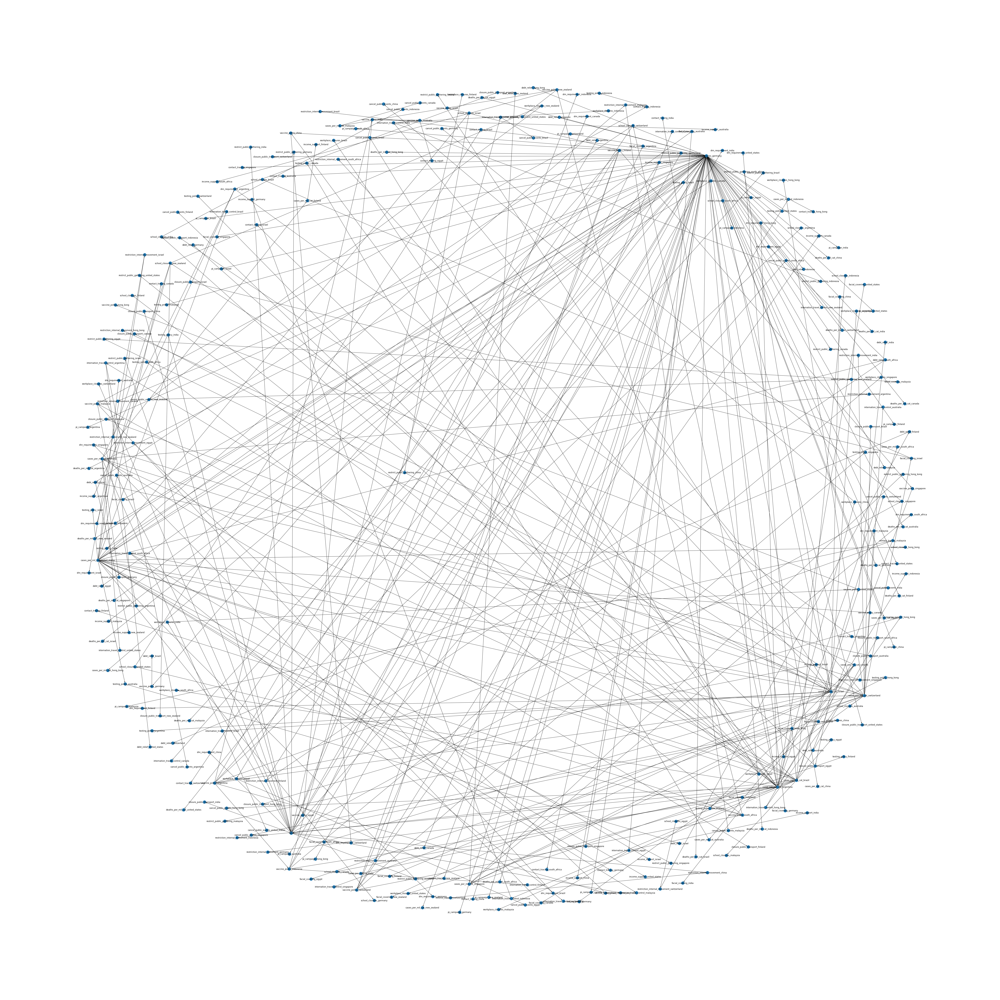

In [9]:
import networkx as nx
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1, figsize=(80, 80))
nx.draw(model, with_labels=True, ax=ax)
plt.tight_layout()

## Evaluation

In [10]:
countries = list(covid_policies_df.index.get_level_values(0).unique())

In [11]:
%load_ext jupyterlab_notify

In [12]:
%%notify

combined_true_y = []
combined_pred_y = []
countrywise_true_y = {}
countrywise_pred_y = {}


for country in countries:
    curr_true_y = list(test_df[f"cases_per_mil_cat_{country}"].values)

    combined_true_y.extend(curr_true_y)
    countrywise_true_y[country] = curr_true_y

    curr_pred_y = []
    for _, row in test_df[
        [f"income_support_{country}", f"debt_relief_{country}",]
    ].iterrows():
        curr_result = ve.query(
            [f"cases_per_mil_cat_{country}"],
            {
                f"income_support_{country}": row[f"income_support_{country}"],
                f"debt_relief_{country}": row[f"debt_relief_{country}"],
            },
            show_progress=False,
        )
        curr_pred_y.append(
            curr_result.state_names[f"cases_per_mil_cat_{country}"][
                np.argmax(curr_result.values)
            ]
        )

    combined_pred_y.extend(curr_pred_y)
    countrywise_pred_y[country] = curr_pred_y

assert len(combined_true_y) == len(combined_pred_y)

In [13]:
compute_evaluation_metrics(combined_true_y, combined_pred_y)

{'accuracy': 0.7709090909090909,
 'f1': 0.7256658658193186,
 'recall': 0.7709090909090909}

In [14]:
%%notify

combined_true_y_im = []
combined_pred_y_im = []
countrywise_true_y_im = {}
countrywise_pred_y_im = {}


for country in countries:
    curr_true_y = list(test_df[f"restriction_internal_movement_{country}"].values)

    combined_true_y_im.extend(curr_true_y)
    countrywise_true_y_im[country] = curr_true_y

    curr_pred_y = []
    for _, row in test_df[
        [f"income_support_{country}", f"debt_relief_{country}",]
    ].iterrows():
        curr_result = ve.query(
            [f"restriction_internal_movement_{country}"],
            {
                f"income_support_{country}": row[f"income_support_{country}"],
                f"debt_relief_{country}": row[f"debt_relief_{country}"],
            },
            show_progress=False,
        )
        curr_pred_y.append(
            curr_result.state_names[f"restriction_internal_movement_{country}"][
                np.argmax(curr_result.values)
            ]
        )

    combined_pred_y_im.extend(curr_pred_y)
    countrywise_pred_y_im[country] = curr_pred_y

assert len(combined_true_y_im) == len(combined_pred_y_im)

In [15]:
compute_evaluation_metrics(combined_true_y_im, combined_pred_y_im)

{'accuracy': 0.9054545454545454,
 'f1': 0.9043357933228995,
 'recall': 0.9054545454545454}

## Insights

In [16]:
for col in train_df.filter(regex="debt_relief_[a-z]"):
    print(col, train_df[col].unique())

debt_relief_india [1. 0. 2.]
debt_relief_malaysia [2.]
debt_relief_indonesia [1.]
debt_relief_germany [0. 1. 2.]
debt_relief_brazil [0. 1.]
debt_relief_australia [0. 2. 1.]
debt_relief_new_zealand [2. 0. 1.]
debt_relief_israel [1. 2.]
debt_relief_canada [1.]
debt_relief_singapore [2.]
debt_relief_switzerland [0. 1.]
debt_relief_united_states [1. 0.]
debt_relief_argentina [1. 0. 2.]
debt_relief_china [2. 1. 0.]
debt_relief_finland [1. 0.]
debt_relief_south_africa [1. 2. 0.]
debt_relief_hong_kong [2.]
debt_relief_egypt [2.]


In [17]:
for col in train_df.filter(regex="income_support_[a-z]"):
    print(col, train_df[col].unique())

income_support_singapore [2 1]
income_support_brazil [1 0]
income_support_canada [1 2]
income_support_united_states [1 2 0]
income_support_new_zealand [1 2]
income_support_china [1]
income_support_india [0 1]
income_support_south_africa [1 0]
income_support_hong_kong [1 2]
income_support_australia [0 1]
income_support_germany [2 1]
income_support_malaysia [1]
income_support_egypt [1]
income_support_finland [2 1]
income_support_israel [2 1]
income_support_indonesia [1 0]
income_support_argentina [1 2 0]
income_support_switzerland [2 0]


In [18]:
for col in train_df.filter(regex="restriction_internal_movement_[a-z]"):
    print(col, train_df[col].unique())

restriction_internal_movement_indonesia [2 1]
restriction_internal_movement_brazil [2]
restriction_internal_movement_germany [0 1 2]
restriction_internal_movement_malaysia [2 1 0]
restriction_internal_movement_australia [2 1]
restriction_internal_movement_south_africa [0 1 2]
restriction_internal_movement_israel [0 2]
restriction_internal_movement_egypt [0 2]
restriction_internal_movement_new_zealand [2 0 1]
restriction_internal_movement_singapore [0 2]
restriction_internal_movement_united_states [1 2]
restriction_internal_movement_switzerland [0 1]
restriction_internal_movement_canada [2]
restriction_internal_movement_finland [0 1]
restriction_internal_movement_hong_kong [1 0]
restriction_internal_movement_india [2 0 1]
restriction_internal_movement_argentina [2 1 0]
restriction_internal_movement_china [2 1 0]


In [32]:
print(
    "p(restriction_internal_movement_argentina|income_support_argentina=0, debt_relief_argentina=0) - No Relief"
)
print(
    ve.query(
        [f"restriction_internal_movement_argentina"],
        {f"income_support_argentina": 0, f"debt_relief_argentina": 0,},
        show_progress=False,
    )
)

p(restriction_internal_movement_argentina|income_support_argentina=0, debt_relief_argentina=0) - No Relief
+--------------------------------------------+------------------------------------------------+
| restriction_internal_movement_argentina    |   phi(restriction_internal_movement_argentina) |
+============================================+================================================+
| restriction_internal_movement_argentina(0) |                                         0.3128 |
+--------------------------------------------+------------------------------------------------+
| restriction_internal_movement_argentina(1) |                                         0.3626 |
+--------------------------------------------+------------------------------------------------+
| restriction_internal_movement_argentina(2) |                                         0.3245 |
+--------------------------------------------+------------------------------------------------+


In [33]:
print(
    "p(restriction_internal_movement_argentina|income_support_argentina=1, debt_relief_argentina=1) - Partial Relief"
)

print(
    ve.query(
        [f"restriction_internal_movement_argentina"],
        {f"income_support_argentina": 1, f"debt_relief_argentina": 1},
        show_progress=False,
    )
)

p(restriction_internal_movement_argentina|income_support_argentina=1, debt_relief_argentina=1) - Partial Relief
+--------------------------------------------+------------------------------------------------+
| restriction_internal_movement_argentina    |   phi(restriction_internal_movement_argentina) |
+============================================+================================================+
| restriction_internal_movement_argentina(0) |                                         0.0016 |
+--------------------------------------------+------------------------------------------------+
| restriction_internal_movement_argentina(1) |                                         0.0392 |
+--------------------------------------------+------------------------------------------------+
| restriction_internal_movement_argentina(2) |                                         0.9591 |
+--------------------------------------------+------------------------------------------------+


In [28]:
print(
    ve.query(
        [f"restriction_internal_movement_argentina"],
        {f"income_support_argentina": 1, f"debt_relief_argentina": 2},
        show_progress=False,
    )
)

+--------------------------------------------+------------------------------------------------+
| restriction_internal_movement_argentina    |   phi(restriction_internal_movement_argentina) |
+============================================+================================================+
| restriction_internal_movement_argentina(0) |                                         0.0000 |
+--------------------------------------------+------------------------------------------------+
| restriction_internal_movement_argentina(1) |                                         0.0251 |
+--------------------------------------------+------------------------------------------------+
| restriction_internal_movement_argentina(2) |                                         0.9749 |
+--------------------------------------------+------------------------------------------------+


In [29]:
print(
    ve.query(
        [f"restriction_internal_movement_argentina"],
        {f"income_support_argentina": 2, f"debt_relief_argentina": 1},
        show_progress=False,
    )
)

+--------------------------------------------+------------------------------------------------+
| restriction_internal_movement_argentina    |   phi(restriction_internal_movement_argentina) |
+============================================+================================================+
| restriction_internal_movement_argentina(0) |                                         0.1585 |
+--------------------------------------------+------------------------------------------------+
| restriction_internal_movement_argentina(1) |                                         0.0373 |
+--------------------------------------------+------------------------------------------------+
| restriction_internal_movement_argentina(2) |                                         0.8042 |
+--------------------------------------------+------------------------------------------------+
